<a href="https://colab.research.google.com/github/mgje/PIUMP/blob/master/coLab-Notebooks/Feder_Partikel_Systeme.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# import Bibliotheken
import numpy as np
from matplotlib.patches import Circle, Wedge, Polygon, Arrow, ArrowStyle, RegularPolygon,Rectangle,ConnectionPatch
import matplotlib.lines as lines
from matplotlib.collections import PatchCollection
from matplotlib import animation,rc
from IPython.display import HTML
from IPython.display import clear_output
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import time
from base64 import b64encode
plt.style.use('seaborn-white')

#%matplotlib --list
#plt.style.available

# Klasse für Partikel definieren

Portieren aus Javascirpt von Coding-Train
von the coding train
https://github.com/CodingTrain/website/blob/main/CodingChallenges/CC_160_spring_forces/spring-oop/particle.js

```
class Particle {
  constructor(x, y) {
    this.acceleration = createVector(0, 0);
    this.velocity = createVector(0, 0);
    this.position = createVector(x, y);
    this.mass = 1; // Let's do something better here!
  }

  applyForce(force) {
    let f = force.copy();
    f.div(this.mass);
    this.acceleration.add(f);
  }

  // Method to update position
  update() {
    this.velocity.mult(0.99);

    this.velocity.add(this.acceleration);
    this.position.add(this.velocity);
    this.acceleration.mult(0);
  }

  // Method to display
  show() {
    stroke(255);
    strokeWeight(2);
    fill(45, 197, 244);
    ellipse(this.position.x, this.position.y, 64);
  }
}
```

In [ ]:
class Particle:
  def __init__(self, x, y,locked=False):
    self.locked = locked
    self.x = x
    self.y = y
    self.besch = np.array([.0,.0]) # Beschleunigung
    self.gesch = np.array([.0,.0]) # Geschwindigkeit
    self.pos = np.array([x,y],dtype="float64")
    self.m = 1 # Masse als konst auf 1 setzen

  def __str__(self):
    return f"Pos = {self.pos[0]} , {self.pos[1]}"

  def applyForce(self, force):
    f = force.copy()
    f = f / self.m 
    self.besch = self.besch + f

  def update(self):
    if not self.locked:
      self.gesch *= 0.99
      self.gesch += self.besch
      self.pos += self.gesch
      self.besch *= 0

  # color names can be found here  
  # https://matplotlib.org/stable/gallery/color/named_colors.html
  def show(self):
    return self.pos





## Klasse testen mit mehr mals eine Kraft wirkene lassen

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))

ax.set_xlim(( 0, 600))
ax.set_ylim(( 0, 600))


p1 = Particle(234,432)

plc = Circle((1,2),30)
pa = ax.add_patch(plc)
pa.set_alpha(0.8)
pa.set_color("orange")

plt.close()

# 2. Start 
def init():
  plc.center=(0,1)
  return [plc,]

# 3. Animationsfunktion wird immer wieder aufgerufen mit neuem i
def animate(i):
  p1.applyForce(np.array([0.12,0]))
  p1.update()
  plc.center=p1.show()
  return [plc,]


# 4. Animation aufrufen, blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=30, interval=15, blit=False)

rc('animation',html='jshtml')
display(anim)  




# Feder Klasse


von coding Train
https://github.com/CodingTrain/website/blob/main/CodingChallenges/CC_160_spring_forces/spring-oop/spring.js

```
class Spring {
  constructor(k, restLength, a, b) {
    this.k = k;
    this.restLength = restLength;
    this.a = a;
    this.b = b;
  }

  update() {
    let force = p5.Vector.sub(this.b.position, this.a.position);
    let x = force.mag() - this.restLength;
    force.normalize();
    force.mult(this.k * x);
    this.a.applyForce(force);
    force.mult(-1);
    this.b.applyForce(force);
  }

  show() {
    strokeWeight(4);
    stroke(255);
    line(
      this.a.position.x,
      this.a.position.y,
      this.b.position.x,
      this.b.position.y
    );
  }
}

```

In [ ]:
class Spring:
  def __init__(self,k,restL,a,b):
    self.k = k
    self.restL = restL
    self.a = a
    self.b = b

  def __str__(self):
    return f"Feder zwischen A ({a.pos[0]} , {a.pos[1]}) und B ({b.pos[0]} , {b.pos[1]})"

  def update(self):
    f = self.b.pos-self.a.pos
    x = np.linalg.norm(f)-self.restL
    f = f/np.linalg.norm(f)
    f = f*self.k*x
    self.a.applyForce(f)
    f = f * (-1)
    self.b.applyForce(f)

  def show(self):
    return self.a.pos, self.b.pos
    


animated gif, braucht etwas Zeit



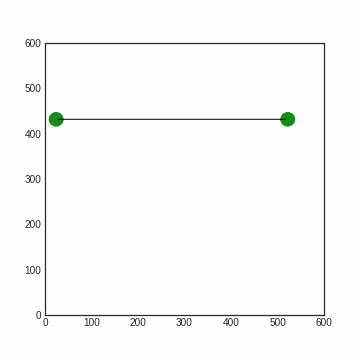

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))

ax.set_xlim(( 0, 600))
ax.set_ylim(( 0, 600))


p1 = Particle(23,432)
p2 = Particle(523,432)

l = Spring(0.01,400,p1,p2)


# Points
pls = []
pls.append(Circle((0,0),15))
pls.append(Circle((20,40),15))

for p in pls:
  tmp=ax.add_patch(p)
  tmp.set_alpha(0.9)
  tmp.set_color("green")


### connections
con = []
con.append(ConnectionPatch((0,0),(10,10),"data", "data",arrowstyle="-", shrinkA=2, shrinkB=2, mutation_scale=20, fc="w"))
for c in con:
  tmp = ax.add_patch(c)



plt.close()

# 2. Start 
def init():
  for p in pls:
    p.center=(0,0)
  con[0].xy1 = (0,0)
  con[0].xy2 = (0,10)
  return [pls,con[0]]


# 3. Animationsfunktion wird immer wieder aufgerufen mit neuem i
def animate(i):
  l.update()
  p1.update()
  p2.update()
  
  a,b = l.show()
  #print(a,b)
  
  pls[0].center=a
  pls[1].center=b
  con[0].xy1 = a
  con[0].xy2 = b
  return [pls,con[0]]



# 4. Animation aufrufen, blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=126, interval=25, blit=False)

#rc('animation',html='jshtml')
#display(anim)  

# animated gif
print('animated gif, braucht etwas Zeit')
fn='spring.gif'


writergif = animation.PillowWriter(fps=60) 
#als Datei speichern

anim.save(fn,writer=writergif)

#Film aus Datei laden
gif = open(fn,'rb').read()
#Film in base64 codieren
data_url = "data:image/gif;base64," + b64encode(gif).decode()


#HTMLausgabe
display(HTML('''
  <img src='%s' >
  
''' % data_url))

# Kette mit dem ersten fest gezurrt



In [ ]:
fig, ax = plt.subplots(figsize=(5,5))

ax.set_xlim(( 0, 600))
ax.set_ylim(( 0, 600))

particles = []
springs = []

dx = 83
rs = 20

# Points
ps = []
#joints
abs = []
for i in range(5):
  particles.append(Particle(100+i*dx,570))
  ps.append((100+i*dx,570))
  if i>0:
    springs.append(Spring(0.02,rs,particles[i-1],particles[i]))
    abs.append([ps[i-1],ps[i]])

particles[0].locked=True 

pls = [] # Circle array 

for p in ps:
  pls.append(Circle(p,15))
for p in pls:
  tmp=ax.add_patch(p)
  tmp.set_alpha(0.9)
  tmp.set_color("green")


### connections
con = []

for a,b in abs:
  con.append(ConnectionPatch(a,b,"data", "data",arrowstyle="-", shrinkA=2, shrinkB=2, mutation_scale=20, fc="w"))
for c in con:
  tmp = ax.add_patch(c)

plt.close()

# 2. Start 
def init():
  for p in pls:
    p.center=(0,0)
  return [pls,]

# 3. Animationsfunktion wird immer wieder aufgerufen mit neuem i
def animate(i):
  #print(i)

  for i in range(len(springs)):
    springs[i].update()
    a,b = springs[i].show()
    con[i].xy1 = a
    con[i].xy2 = b
 
  for i in range(len(particles)):
    particles[i].update()
    pls[i].center = particles[i].show()
  return [pls,con]


# 4. Animation aufrufen, blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=150, interval=25, blit=False)

rc('animation',html='jshtml')
display(anim)  

# animated gif
#print('animated gif, braucht etwas Zeit')
#fn='springA.gif'

#writergif = animation.PillowWriter(fps=40) 

#als Datei speichern
#anim.save(fn,writer=writergif)


#Film aus Datei laden
#gif = open(fn,'rb').read()
#Film in base64 codieren
#data_url = "data:image/gif;base64," + b64encode(gif).decode()


#HTMLausgabe
#display(HTML('''
  
#  <img src='%s' >
#''' % data_url))

#np.linalg.norm(p1.gesch)

# Nun schalten wir die Gravitation ein

animated gif, braucht etwas Zeit



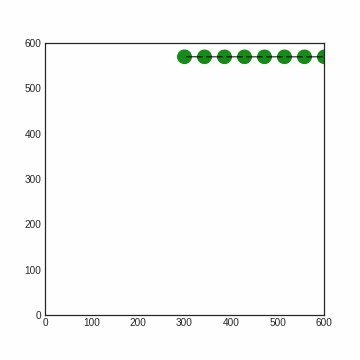

3.1394089914505368

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))

ax.set_xlim(( 0, 600))
ax.set_ylim(( 0, 600))

particles = []
springs = []

dx = 43
rs = 20

# Points
ps = []
#joints
abs = []

for i in range(10):
  particles.append(Particle(300+i*dx,570))
  ps.append((300+i*dx,570))
  if i>0:
    springs.append(Spring(0.02,rs,particles[i-1],particles[i]))
    abs.append([ps[i-1],ps[i]])

particles[0].locked=True 
pls = [] # Circle array 

for p in ps:
  pls.append(Circle(p,15))
for p in pls:
  tmp=ax.add_patch(p)
  tmp.set_alpha(0.9)
  tmp.set_color("green")


### connections
con = []

for a,b in abs:
  con.append(ConnectionPatch(a,b,"data", "data",arrowstyle="-", shrinkA=2, shrinkB=2, mutation_scale=20, fc="w"))
for c in con:
  tmp = ax.add_patch(c)
plt.close()

# 2. Start 
def init():
  for p in pls:
    p.center=(0,0)
  return [pls,]

# 3. Animationsfunktion wird immer wieder aufgerufen mit neuem i
def animate(i):
  #print(i)
  
  for i in range(len(springs)):
    springs[i].update()
    a,b = springs[i].show()
    con[i].xy1 = a
    con[i].xy2 = b
  
  g = np.array([0.0,-0.1])

  for i in range(len(particles)):
    particles[i].applyForce(g)
    particles[i].update()
    pls[i].center = particles[i].show()
  return [pls,con]

# 4. Animation aufrufen, blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=700, interval=10, blit=False)

#rc('animation',html='jshtml')
#display(anim)  

# animated gif
print('animated gif, braucht etwas Zeit')
fn='spring2.gif'

writergif = animation.PillowWriter(fps=50) 

#als Datei speichern
anim.save(fn,writer=writergif)


#Film aus Datei laden
gif = open(fn,'rb').read()
#Film in base64 codieren
data_url = "data:image/gif;base64," + b64encode(gif).decode()


#HTMLausgabe
display(HTML('''
  <img src='%s' >
  
''' % data_url))

np.linalg.norm(p1.gesch)